<a href="https://colab.research.google.com/github/Vivek-1102/100xdev-0-100-/blob/main/majorProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Saving Rt Ir.jpg to Rt Ir.jpg


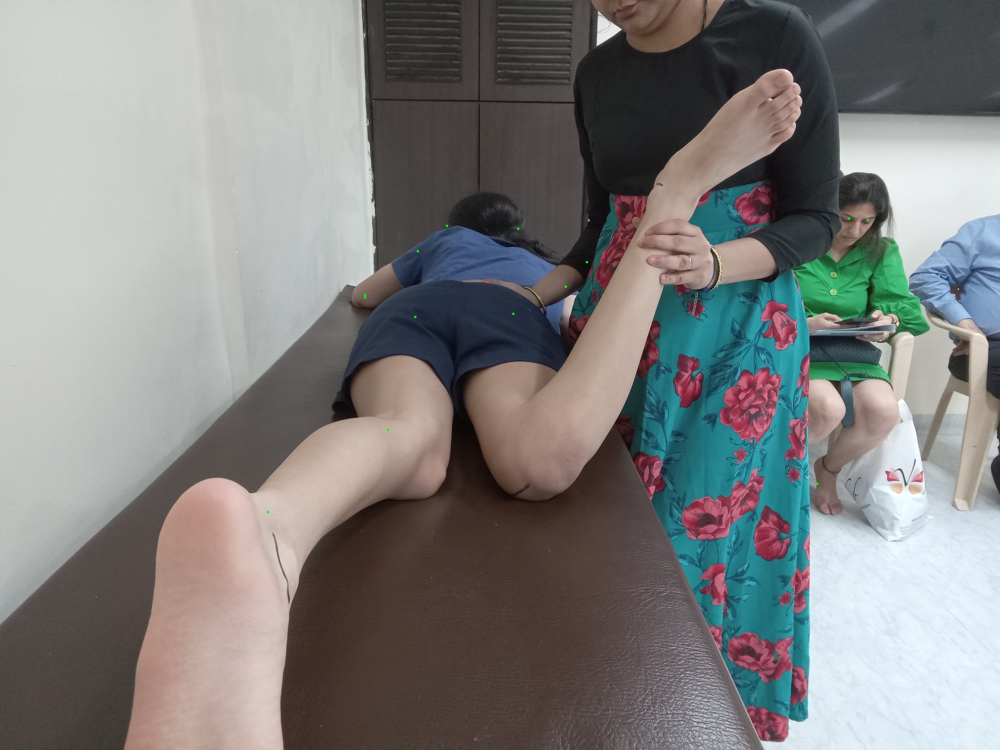

Annotated image saved as 'annotated_pose_movenet.jpg'


In [9]:
# Install the required libraries
!pip install -q tensorflow opencv-python

import tensorflow as tf
import tensorflow_hub as hub
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

# Load the MoveNet model from TensorFlow Hub
model = hub.load("https://tfhub.dev/google/movenet/singlepose/thunder/4")

# Upload the image
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

# Load the image using OpenCV
image = cv2.imread(image_path)

# Resize the image to the size expected by MoveNet (256x256 for Thunder version)
input_size = 256
image_resized = cv2.resize(image, (input_size, input_size))

# Convert the image to RGB
image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)

# Convert the image to a tensor and expand dimensions to match model input shape
input_image = tf.convert_to_tensor(image_rgb, dtype=tf.int32)
input_image = tf.expand_dims(input_image, axis=0)

# Run inference and extract the keypoints tensor
outputs = model.signatures['serving_default'](input_image)
keypoints = outputs['output_0'].numpy()

# Visualize the keypoints on the original image
def draw_keypoints(image, keypoints, threshold=0.2):
    height, width, _ = image.shape
    for kp in keypoints[0][0]:
        y, x, confidence = kp
        if confidence > threshold:
            # Convert normalized coordinates to pixel values
            cx, cy = int(x * width), int(y * height)
            cv2.circle(image, (cx, cy), 5, (0, 255, 0), -1)
    return image

# Draw the detected keypoints on the image
annotated_image = draw_keypoints(image.copy(), keypoints)

# Display the annotated image
cv2_imshow(annotated_image)

# Save the annotated image
cv2.imwrite('annotated_pose_movenet.jpg', annotated_image)
print("Annotated image saved as 'annotated_pose_movenet.jpg'")
